## Need a pipeline which connects all 3 types and need to apply them on a dataset of images

In [113]:
import torch
import torch.nn as nn
import torch.nn.functional as F
import matplotlib.pyplot as plt
from torchvision import transforms
from PIL import Image
import numpy as np
from torch.utils.data import Dataset
import os
from torch.utils.data import DataLoader
from tqdm import tqdm

# Dataset preparation

class My_Dataset(Dataset):
    def __init__(self, img_dir, transform=None):
        self.img_dir = img_dir
        self.transform = transform
        self.images = [f for f in os.listdir(img_dir) if f.endswith(('.png', '.jpg', '.jpeg'))]

    def __len__(self):
        return len(self.images)

    def __getitem__(self, idx):
        img_path = os.path.join(self.img_dir, self.images[idx])
        image = Image.open(img_path).convert('RGB')
        
        if self.transform:
            image = self.transform(image)
        
        return image

transform = transforms.Compose([
    transforms.Resize((256, 256)), 
    transforms.ToTensor(), 
    transforms.Normalize((0.5, 0.5, 0.5), (0.5, 0.5, 0.5)),
])


img_dir = '/data/raml/group1/Arbeit-chinna/RAML/Dataset'
dataset = My_Dataset(img_dir, transform=transform)
dataloader = DataLoader(dataset=dataset, batch_size=1, shuffle=False)




def PSNR(x, gt):
    return 10 * torch.log10(torch.max(x) / torch.mean((x - gt) ** 2))


# 1 implicit method - NN (linear layers)
class Net2D(torch.nn.Module):
    def __init__(self, sigma=5, hidden=64):
        super(Net2D, self).__init__()
        self.fc1 = torch.nn.Linear(2, hidden, bias=False)
        self.fc1.weight.data = torch.randn(hidden, 2) * sigma
        self.activation = torch.nn.GELU()
        self.fc2 = torch.nn.Linear(2 * hidden, hidden)
        self.fc3 = torch.nn.Linear(hidden, 3)

    def forward(self, x):
        x = self.fc1(x)
        x = torch.concat([torch.sin(2 * np.pi * x), torch.cos(2 * np.pi * x)], dim=1)
        x = self.activation(self.fc2(x))
        x = self.fc3(x)
        return x


# 2nd method Fourier representation

class GaussianFourierFeature(nn.Module):
    def __init__(self, in_features, mapping_size, scale):
        super(GaussianFourierFeature, self).__init__()
        
        self.B = nn.Parameter(scale * torch.randn(mapping_size, in_features), requires_grad=False)
   
    def forward(self, x):
        x_proj = 2 * np.pi * x @ self.B.t()
        return torch.concat([torch.sin(x_proj), torch.cos(x_proj)], dim=-1)

class FourierFeatureNetwork(nn.Module):
    def __init__(self, in_features, hidden_features, out_features, mapping_size, scale):
        super(FourierFeatureNetwork, self).__init__()
        self.f_tr = GaussianFourierFeature(in_features, mapping_size, scale)
        self.fc1 = nn.Linear(2 * mapping_size, hidden_features)
        self.fc2 = nn.Linear(hidden_features, hidden_features)
        self.fc3 = nn.Linear(hidden_features, out_features)
        self.relu = nn.ReLU()
    
    def forward(self, x):
        x = self.f_tr(x)
        x = self.relu(self.fc1(x))
        x = self.relu(self.fc2(x))
        x = self.fc3(x)
        return x
    

# 3rd method WIRE representation    

class RealGaborLayer(nn.Module):    
    def __init__(self, in_features, out_features, bias=True,
                 omega=20.0, scale=30.0,
                 trainable=False):
        super().__init__()
        self.omega_0 = omega
        self.scale_0 = scale
        # self.is_first = is_first
        
        self.in_features = in_features
        
        self.freqs = nn.Linear(in_features, out_features, bias=bias)
        self.scale = nn.Linear(in_features, out_features, bias=bias)
        
    def forward(self, input):
        omega = self.omega_0 * self.freqs(input)
        scale = self.scale(input) * self.scale_0
        
        return torch.cos(omega)*torch.exp(-(scale**2))
    
    # Complex version is also available   
    # standard values of omega_0 = 20, scale_0 = 30

class WIRE_real(nn.Module):
    def __init__(self, in_features, hidden_features, out_features,
                 omega=20, scale=30, ):
        super().__init__()
        self.nonlin = RealGaborLayer # using Real Gabor la
        dtype = torch.float
        self.net = []
        
        self.net.append(self.nonlin(in_features, hidden_features, omega=omega, scale=scale))
        self.net.append(self.nonlin(hidden_features, hidden_features, omega=omega, scale=scale))
        # self.net.append(self.nonlin(in_features, hidden_features, omega=omega, scale=scale))
        
        final_linear = nn.Linear(hidden_features, out_features, dtype=dtype)
        self.net.append(final_linear)
        self.net = nn.Sequential(*self.net)
        
    def forward(self, coords):
        x = self.net(coords)
        return x
    
# 4th Complex Gerbor with WIRE   
class ComplexGaborLayer2D(nn.Module):
    def __init__(self, in_features, out_features, bias=True,
                 is_first=False, omega0=10.0, sigma0=10.0,
                 trainable=False):
        super().__init__()
        self.omega_0 = omega0
        self.scale_0 = sigma0
        self.is_first = is_first
        
        self.in_features = in_features
        
        if self.is_first:
            dtype = torch.float
        else:
            dtype = torch.cfloat
            
        self.omega_0 = nn.Parameter(self.omega_0*torch.ones(1), trainable)
        self.scale_0 = nn.Parameter(self.scale_0*torch.ones(1), trainable)
        
        self.linear = nn.Linear(in_features, out_features, bias=bias, dtype=dtype)
        self.scale_orth = nn.Linear(in_features, out_features, bias=bias, dtype=dtype)
    
    def forward(self, input):
        lin = self.linear(input)
        scale_x = lin
        scale_y = self.scale_orth(input)
        freq_term = torch.exp(1j*self.omega_0*lin)
        arg = scale_x.abs().square() + scale_y.abs().square()
        gauss_term = torch.exp(-self.scale_0*self.scale_0*arg)
        return freq_term*gauss_term


class WIRE_cmplx(nn.Module):
    def __init__(self, in_features, hidden_features, hidden_layers, out_features, 
                 first_omega_0=10, hidden_omega_0=10., scale=10.0):
        super().__init__()
        
        self.nonlin = ComplexGaborLayer2D
        hidden_features = int(hidden_features/2)  # Reduce hidden features for complex numbers
        
        self.net = []
        self.net.append(self.nonlin(in_features, hidden_features, 
                                    omega0=first_omega_0, sigma0=scale, 
                                    is_first=True, trainable=False))

        for _ in range(hidden_layers):
            self.net.append(self.nonlin(hidden_features, hidden_features, 
                                        omega0=hidden_omega_0, sigma0=scale))

        final_linear = nn.Linear(hidden_features, out_features, dtype=torch.cfloat)
        self.net.append(final_linear)
        
        self.net = nn.Sequential(*self.net)
    
    def forward(self, coords):
        output = self.net(coords)
        return output.real
    
# Training loop
class Deblurring_training():
    def __init__(self, y, net,  method_used = str , num_samples=2000, alpha=0.02, lr=0.01 ,**kwargs):
        self.y = y
        self.net = net
        self.method_used = method_used
        self.num_samples = num_samples
        self.alpha = alpha
        self.lr = lr
        self.kwargs = kwargs
        self.device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
        
        self.height, self.width = y.shape[2], y.shape[3]
        #self.x_torch = torch.stack(torch.meshgrid(torch.linspace(0, 1, self.height), torch.linspace(0, 1, self.width)), dim=-1).view(-1, 2).to(self.device)
        H, W = self.height, self.width
        a = torch.linspace(-1, 1, W).to(self.device)
        b = torch.linspace(-1, 1, H).to(self.device)

        X, Y = torch.meshgrid(a, b, indexing='xy')
        self.x_torch = torch.hstack((X.reshape(-1, 1), Y.reshape(-1, 1)))
        
        self.y = self.y.to(self.device)
        
        self.model = self.net(**self.kwargs).to(self.device)
        self.optimizer = torch.optim.Adam(params=self.model.parameters(), lr=self.lr)
        self.scheduler = torch.optim.lr_scheduler.LambdaLR(self.optimizer, lambda x: 0.1**min(x/self.num_samples, 1))
        
        self.Gaussian_kernel = self.create_gaussian_kernel().to(self.device)
        self.y_blurry_noisy = self.create_blurry_noisy_image()
        
        self.diff_kernel_x = torch.tensor([[-1, 1]], dtype=torch.float).view(1, 1, 1, 2).repeat(3, 1, 1, 1).to(self.device)
        self.diff_kernel_y = torch.tensor([[-1], [1]], dtype=torch.float).view(1, 1, 2, 1).repeat(3, 1, 1, 1).to(self.device)
        
        
    # Gaussian Blur 
    def create_gaussian_kernel(self, kernel_size=21, sigma=2, channels=3):
        a = torch.arange(-kernel_size // 2 + 1., kernel_size // 2 + 1.)
        xx, yy = torch.meshgrid(a, a, indexing='ij')
        kernel = torch.exp(-0.5 * (xx**2 + yy**2) / sigma**2)
        kernel = kernel / torch.sum(kernel)
        
        gaussian_kernel = kernel.expand(channels, 1, kernel_size, kernel_size)
        
        return gaussian_kernel
    
    def create_blurry_noisy_image(self):
        y_blurry = F.conv2d(self.y, self.Gaussian_kernel, groups=3, padding=10)
        y_blurry_noisy = y_blurry + torch.randn_like(y_blurry) * 0.05
        
        return y_blurry_noisy.to(self.device)

    
    def train(self):
        
        Loss = []
        for i in tqdm(range(self.num_samples)):
            self.optimizer.zero_grad()
            
            u = self.model(self.x_torch).view(1, self.height, self.width, 3).permute(0, 3, 1, 2)
            
            convresult = F.conv2d(u, self.Gaussian_kernel, padding=10, groups=3)
            data_term = torch.sum((convresult - self.y_blurry_noisy) ** 2)
            
            regularization_term_x = torch.sum(torch.abs(F.conv2d(u, self.diff_kernel_x, padding=0, groups=3)))
            regularization_term_y = torch.sum(torch.abs(F.conv2d(u, self.diff_kernel_y, padding=0, groups=3)))
            regularization_term = regularization_term_x + regularization_term_y

            loss = data_term + self.alpha * regularization_term
            
            loss.backward()
            self.optimizer.step()
            self.scheduler.step()
            # if i % 100 == 0:
            #     print(f"Epoch {i}, Loss: {loss.item()}")
            
            Loss.append(loss.item())
        self.model.eval()    
        print(f'Minimum loss for the {self.method_used} method: {min(Loss)}')
                
        return u.detach() 
 
class Pipeline():
    def __init__(self, dataloader, alpha = 0.0001, lr = 1e-3, num_samples=2000):
        self.dataloader = dataloader
        self.alpha = alpha
        self.lr = lr
        self.num_samples = num_samples
        self.device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
                
    def run(self):
               
        for images in self.dataloader:
            
            images = images.to(self.device)
            
            deblur_simple = Deblurring_training(images, Net2D, method_used="simple_fourier", 
                                                num_samples=self.num_samples, alpha=self.alpha, lr=self.lr, 
                                                sigma=20, hidden=512)
            u_simple = deblur_simple.train()
            psnr_simple = PSNR(u_simple, images).item()

            deblur_fourier = Deblurring_training(images, FourierFeatureNetwork, method_used="g_fourier", 
                                                 num_samples=self.num_samples, alpha=self.alpha, lr=self.lr, 
                                                 in_features=2, hidden_features=512, out_features=3, 
                                                 mapping_size=512, scale=10.0)
            u_fourier = deblur_fourier.train()
            psnr_fourier = PSNR(u_fourier, images).item()

            deblur_wire_r = Deblurring_training(images, WIRE_real, method_used="WIRE_real", 
                                              num_samples=self.num_samples, alpha=self.alpha, lr=self.lr,
                                               in_features=2, hidden_features=512, out_features=3,
                                              omega=20, scale=30)
            u_wire_real = deblur_wire_r.train()
            psnr_wire_real = PSNR(u_wire_real, images).item()
            
            deblur_wire_c = Deblurring_training(images, WIRE_cmplx, method_used="WIRE_complex", 
                                              num_samples=self.num_samples, alpha=self.alpha, lr=self.lr,
                                              in_features=2, hidden_features=300, hidden_layers=2, out_features=3, 
                                              first_omega_0=10.0, hidden_omega_0=10.0, scale=10.0,)
            u_wire_cmplx = deblur_wire_c.train()
            psnr_wire_cmplx = PSNR(u_wire_cmplx, images).item()
            
            
            
            
            self.Gaussian_kernel = self.create_gaussian_kernel().to(self.device)
            y_blurry_noisy = self.create_blurry_noisy_image(images)
            y_blurry_noisy_display = y_blurry_noisy.squeeze(0).permute(1, 2, 0)
            y_blurry_noisy_display = y_blurry_noisy_display * 0.5 + 0.5
            
            psnr_blur = PSNR(y_blurry_noisy, images).item()            
            # # Visualize results
            self.visualize_results(images, y_blurry_noisy, u_simple, u_fourier, u_wire_real, u_wire_cmplx, 
                                   psnr_blur, psnr_simple, psnr_fourier, psnr_wire_real, psnr_wire_cmplx)
        
        
    def visualize_results(self, images, blurred, u_simple, u_fourier, u_wire_real, u_wire_cmplx, 
                          psnr_blur, psnr_simple, psnr_fourier, psnr_wire_real, psnr_wire_cmplx):
        
        fig, axs = plt.subplots(2, 3, figsize=(15, 10))
        
            
        
        images = images.squeeze().permute(1, 2, 0).cpu().numpy()
        images = images * 0.5 + 0.5
        axs[0, 0].imshow(images)
        axs[0, 0].set_title("Original image")
        axs[0, 0].axis('off')

        blurred = blurred.squeeze().permute(1, 2, 0).cpu().numpy()  
        blurred = blurred * 0.5 + 0.5
        axs[0, 1].imshow(blurred)
        axs[0, 1].set_title(f"Blurry Noisy image\nPSNR: {psnr_blur:.2f}")
        axs[0, 1].axis('off')

        u_simple = u_simple.squeeze().permute(1, 2, 0).cpu().numpy() 
        u_simple = u_simple * 0.5 + 0.5
        axs[0, 2].imshow(u_simple)
        axs[0, 2].set_title(f"Deblurred by Simple Fourier\nPSNR: {psnr_simple:.2f}")
        axs[0, 2].axis('off')
        
        u_fourier = u_fourier.squeeze().permute(1, 2, 0).cpu().numpy()      
        u_fourier = u_fourier * 0.5 + 0.5  
        axs[1, 0].imshow(u_fourier)
        axs[1, 0].set_title(f"Deblurred by Gaussian Fourier\nPSNR: {psnr_fourier:.2f}")
        axs[1, 0].axis('off')

        u_wire_real = u_wire_real.squeeze().permute(1, 2, 0).cpu().numpy()   
        u_wire_real = u_wire_real * 0.5 + 0.5     
        axs[1, 1].imshow(u_wire_real)
        axs[1, 1].set_title(f"Deblurred by WIRE_REAL\nPSNR: {psnr_wire_real:.2f}")
        axs[1, 1].axis('off')
        
        u_wire_cmplx = u_wire_cmplx.squeeze().permute(1, 2, 0).cpu().numpy()   
        u_wire_cmplx = u_wire_cmplx * 0.5 + 0.5     
        axs[1, 2].imshow(u_wire_cmplx)
        axs[1, 2].set_title(f"Deblurred by WIRE_COMPLEX\nPSNR: {psnr_wire_cmplx:.2f}")
        axs[1, 2].axis('off')

        # axs[1, 2].axis('off')  # Empty subplot for balance

        plt.tight_layout()
        plt.show()
              
                
    # Gaussian Blur 
    def create_gaussian_kernel(self, kernel_size=21, sigma=2, channels=3):
        a = torch.arange(-kernel_size // 2 + 1., kernel_size // 2 + 1.)
        xx, yy = torch.meshgrid(a, a, indexing='ij')
        kernel = torch.exp(-0.5 * (xx**2 + yy**2) / sigma**2)
        kernel = kernel / torch.sum(kernel)
        
        gaussian_kernel = kernel.expand(channels, 1, kernel_size, kernel_size)
        
        return gaussian_kernel
    
    def create_blurry_noisy_image(self, input):
        y_blurry = F.conv2d(input, self.Gaussian_kernel, groups=3, padding=10)
        y_blurry_noisy = y_blurry + torch.randn_like(y_blurry) * 0.05
        
        return y_blurry_noisy.to(self.device)
        

  0%|          | 0/20 [00:00<?, ?it/s]

Minimum loss for the simple_fourier method: 673.09912109375
Minimum loss for the g_fourier method: 673.5540161132812
Minimum loss for the WIRE_real method: 676.7344970703125


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Minimum loss for the WIRE_complex method: 687.305908203125


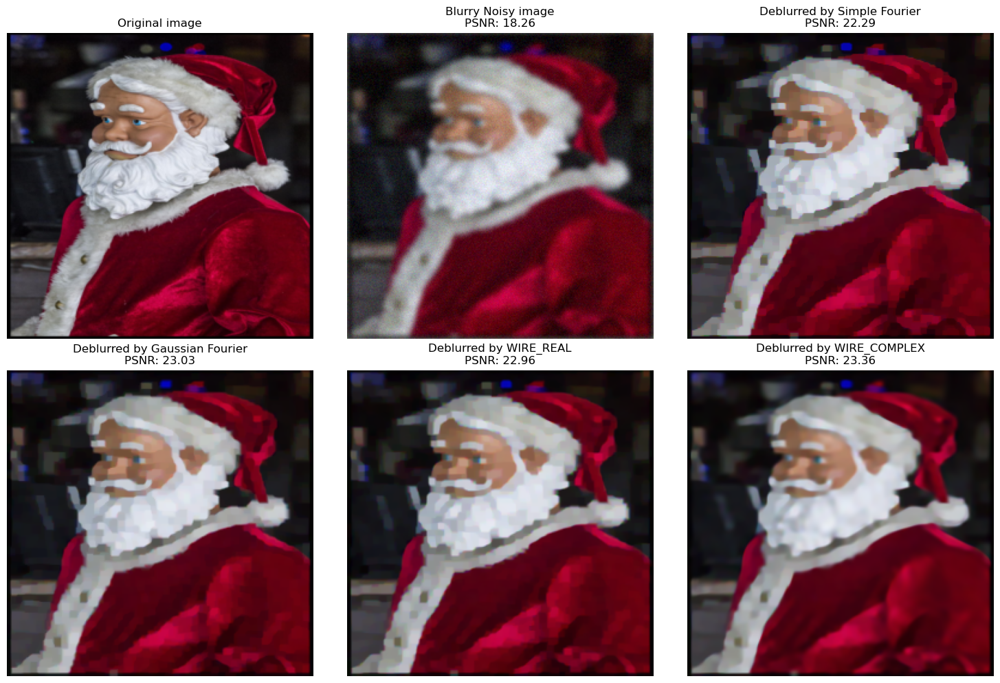

  5%|▌         | 1/20 [11:54<3:46:11, 714.31s/it]

Minimum loss for the simple_fourier method: 639.7398681640625
Minimum loss for the g_fourier method: 636.871337890625
Minimum loss for the WIRE_real method: 639.466064453125


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Minimum loss for the WIRE_complex method: 653.6283569335938


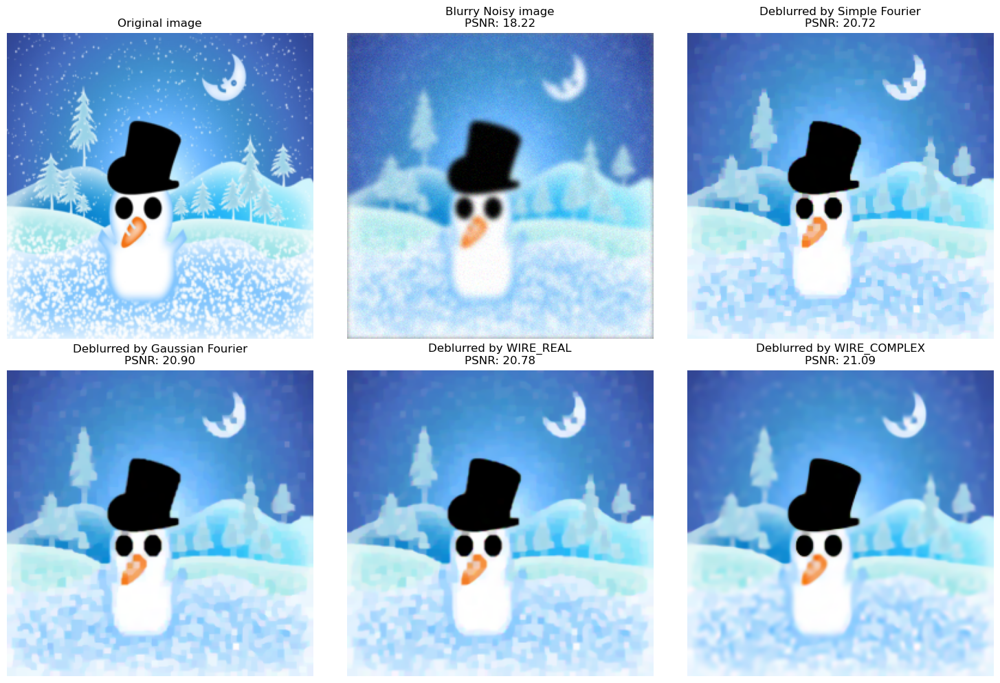

 10%|█         | 2/20 [23:51<3:34:45, 715.88s/it]

Minimum loss for the simple_fourier method: 678.3904418945312
Minimum loss for the g_fourier method: 682.29345703125
Minimum loss for the WIRE_real method: 683.104736328125


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Minimum loss for the WIRE_complex method: 699.927734375


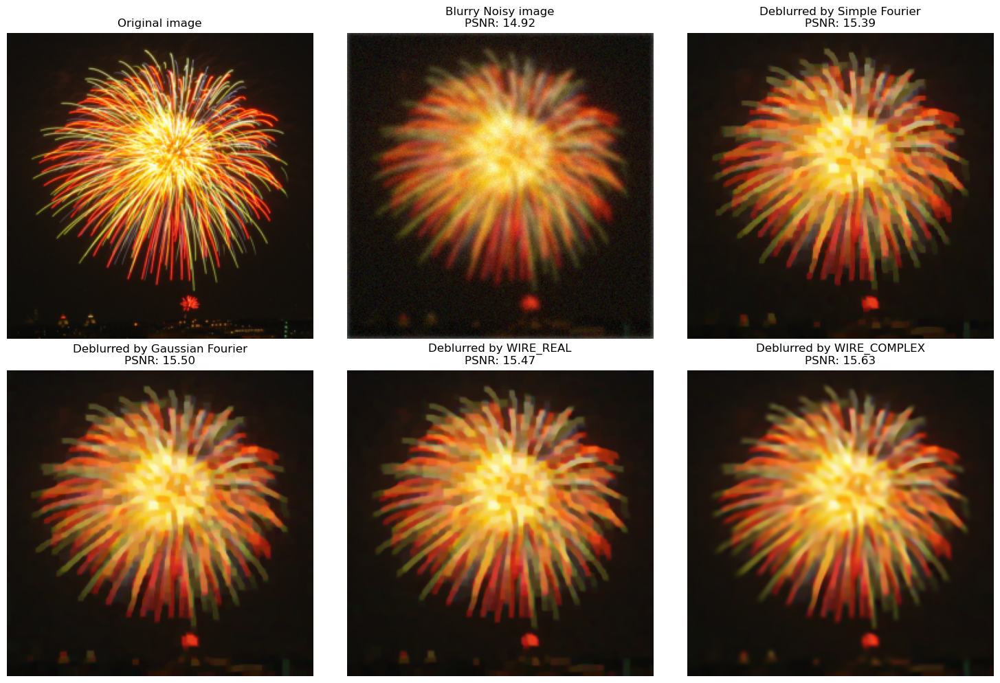

 15%|█▌        | 3/20 [35:47<3:22:56, 716.25s/it]

Minimum loss for the simple_fourier method: 669.2005615234375
Minimum loss for the g_fourier method: 668.5789794921875
Minimum loss for the WIRE_real method: 669.45703125


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Minimum loss for the WIRE_complex method: 674.363037109375


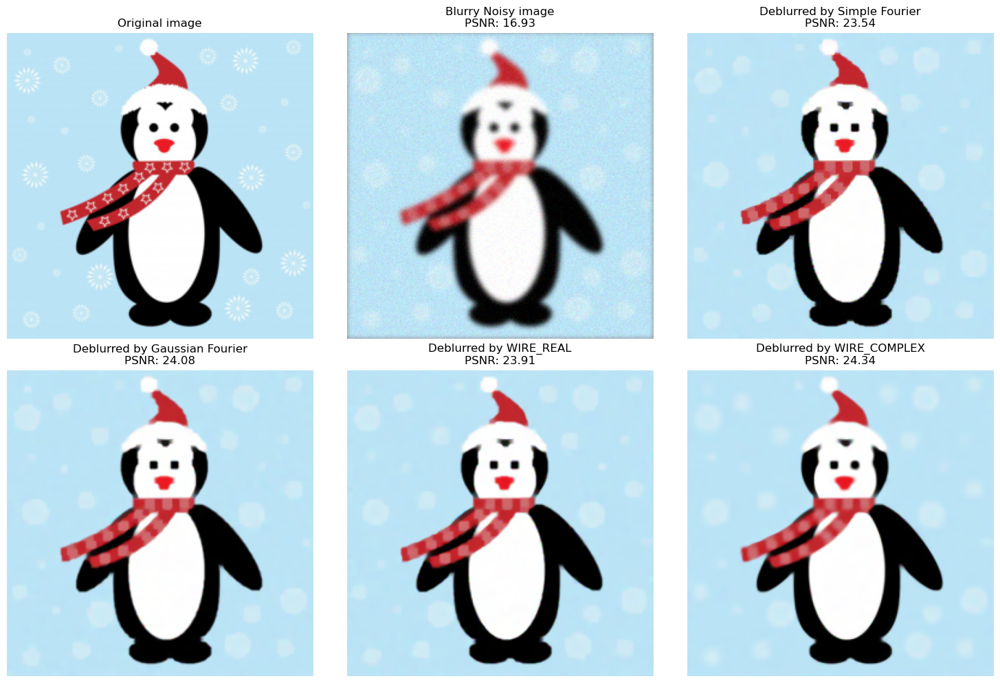

 20%|██        | 4/20 [47:44<3:11:00, 716.31s/it]

Minimum loss for the simple_fourier method: 733.3258666992188
Minimum loss for the g_fourier method: 734.2011108398438
Minimum loss for the WIRE_real method: 736.2962036132812


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Minimum loss for the WIRE_complex method: 737.2423095703125


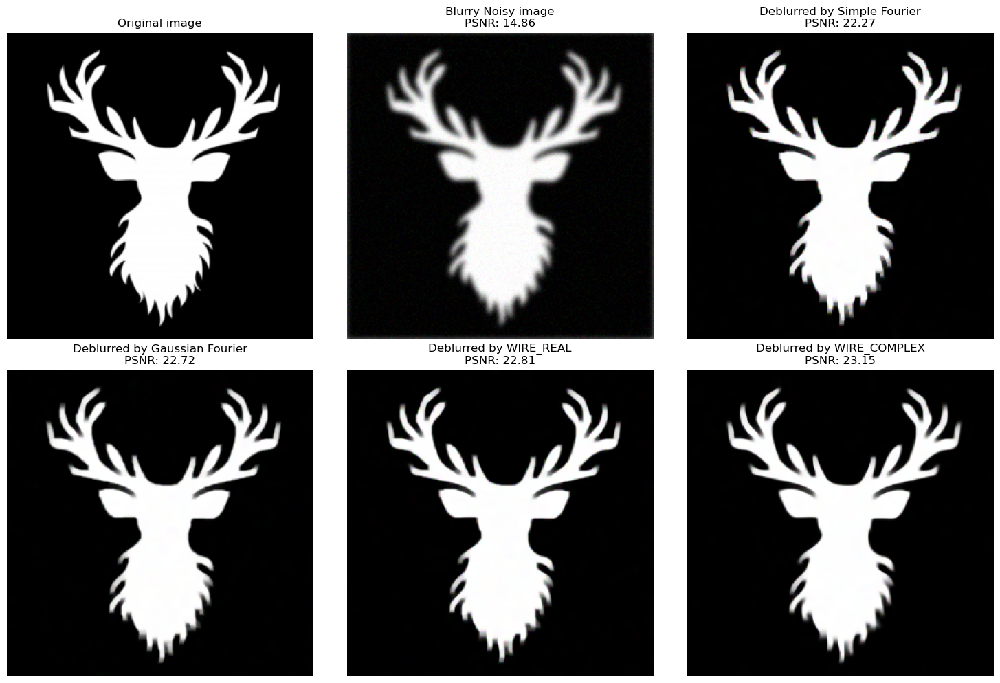

 25%|██▌       | 5/20 [59:40<2:59:05, 716.35s/it]

Minimum loss for the simple_fourier method: 649.3961181640625
Minimum loss for the g_fourier method: 650.3482055664062
Minimum loss for the WIRE_real method: 652.5598754882812


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Minimum loss for the WIRE_complex method: 663.5906372070312


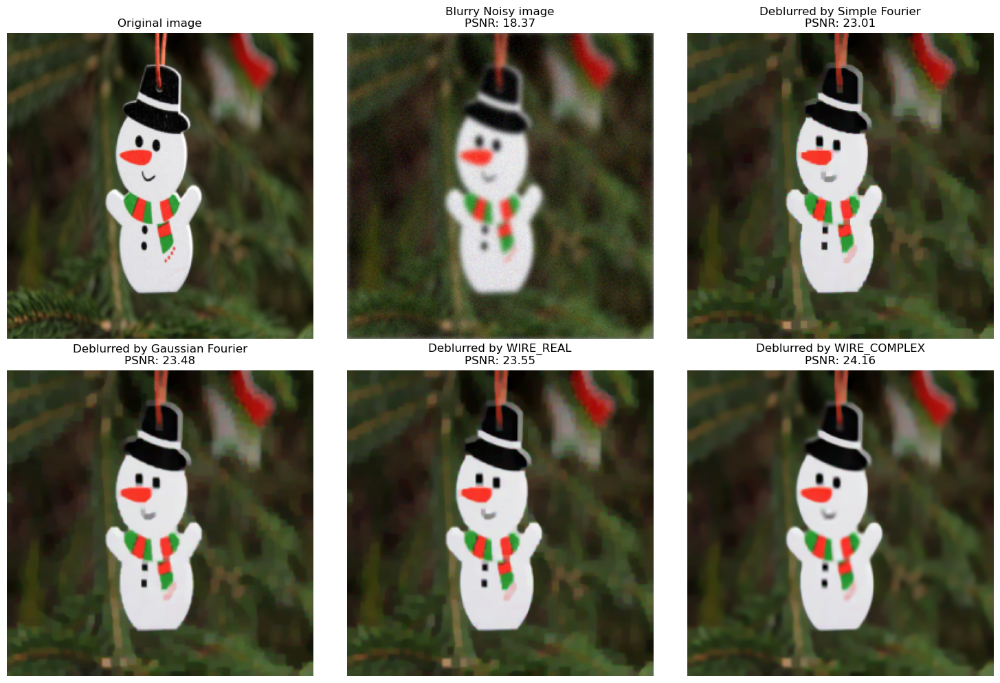

 30%|███       | 6/20 [1:11:37<2:47:09, 716.41s/it]

Minimum loss for the simple_fourier method: 598.0912475585938
Minimum loss for the g_fourier method: 601.333740234375
Minimum loss for the WIRE_real method: 602.4094848632812


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Minimum loss for the WIRE_complex method: 617.359130859375


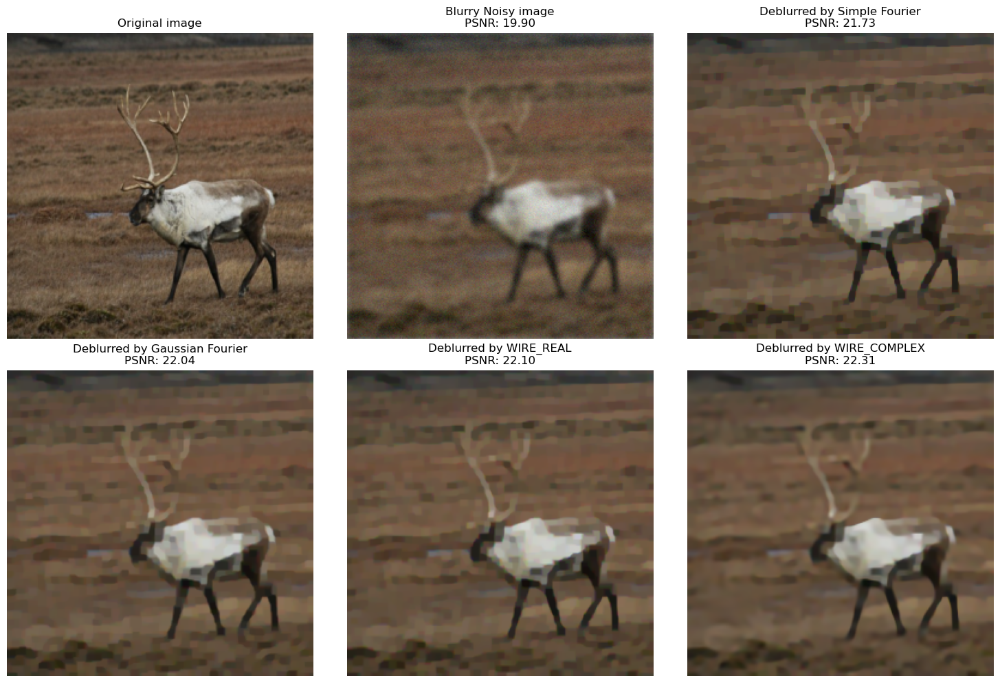

 35%|███▌      | 7/20 [1:23:34<2:35:14, 716.52s/it]

Minimum loss for the simple_fourier method: 581.1238403320312
Minimum loss for the g_fourier method: 583.77294921875
Minimum loss for the WIRE_real method: 583.9451293945312


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Minimum loss for the WIRE_complex method: 587.5181884765625


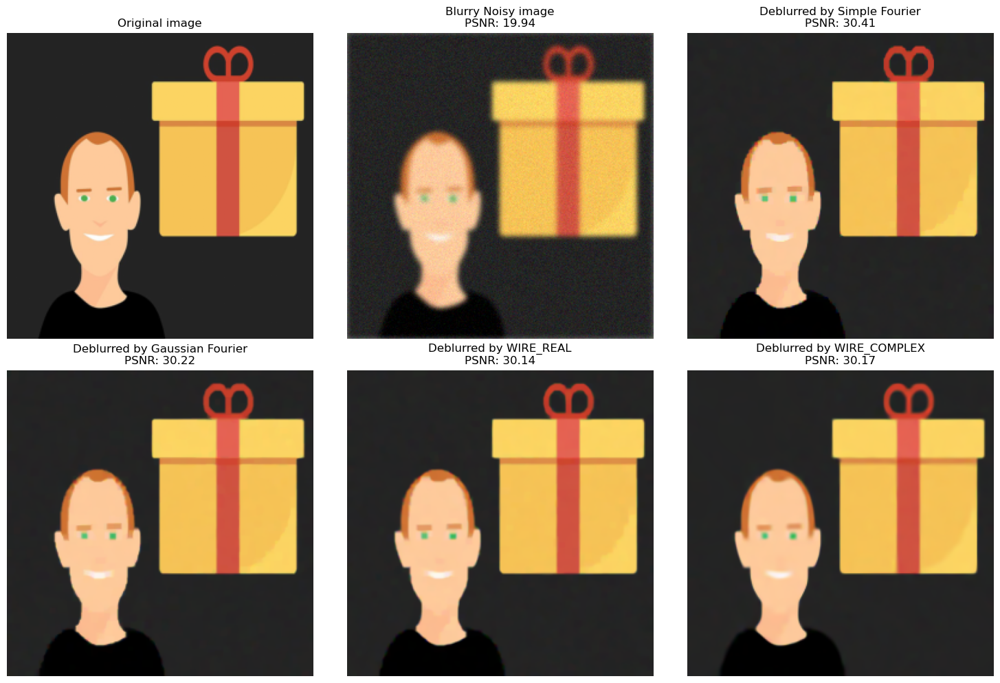

 40%|████      | 8/20 [1:35:30<2:23:19, 716.60s/it]

Minimum loss for the simple_fourier method: 636.4072875976562
Minimum loss for the g_fourier method: 637.505126953125
Minimum loss for the WIRE_real method: 639.2993774414062


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Minimum loss for the WIRE_complex method: 655.3331298828125


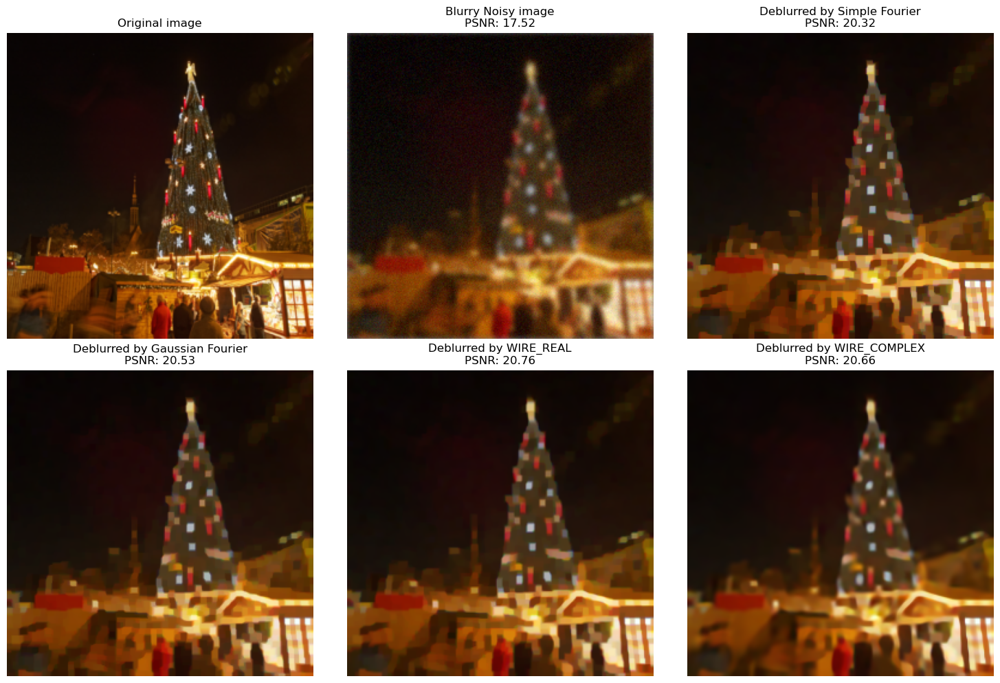

 45%|████▌     | 9/20 [1:47:28<2:11:26, 716.99s/it]

Minimum loss for the simple_fourier method: 655.827880859375
Minimum loss for the g_fourier method: 660.8660888671875
Minimum loss for the WIRE_real method: 659.9979858398438


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Minimum loss for the WIRE_complex method: 669.828857421875


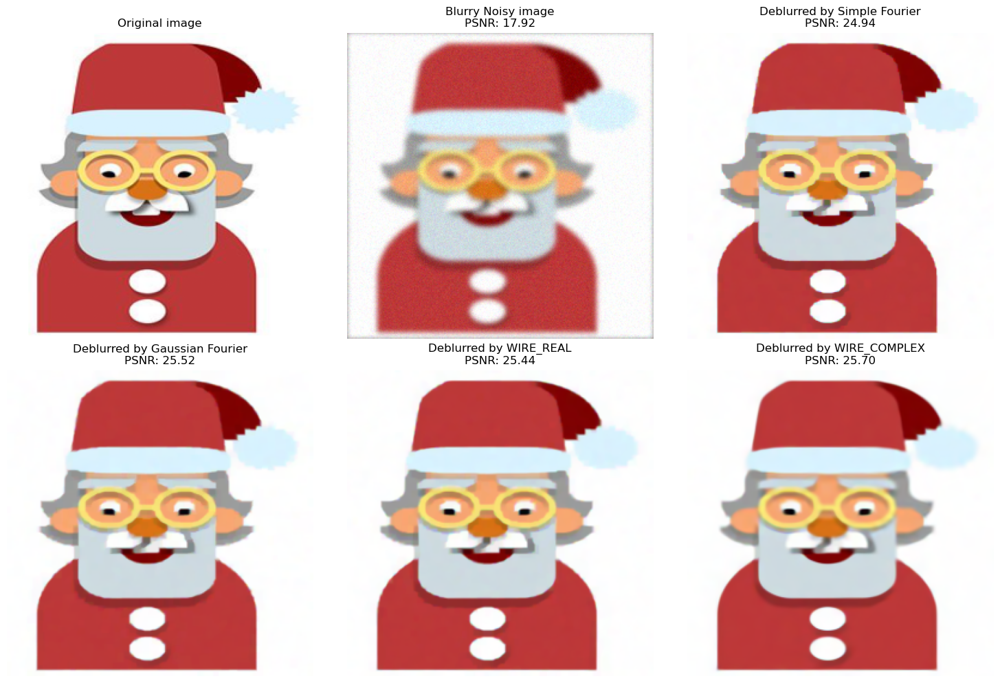

 50%|█████     | 10/20 [1:59:25<1:59:29, 716.93s/it]

Minimum loss for the simple_fourier method: 633.810302734375
Minimum loss for the g_fourier method: 634.5592041015625
Minimum loss for the WIRE_real method: 634.1349487304688


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Minimum loss for the WIRE_complex method: 644.0166625976562


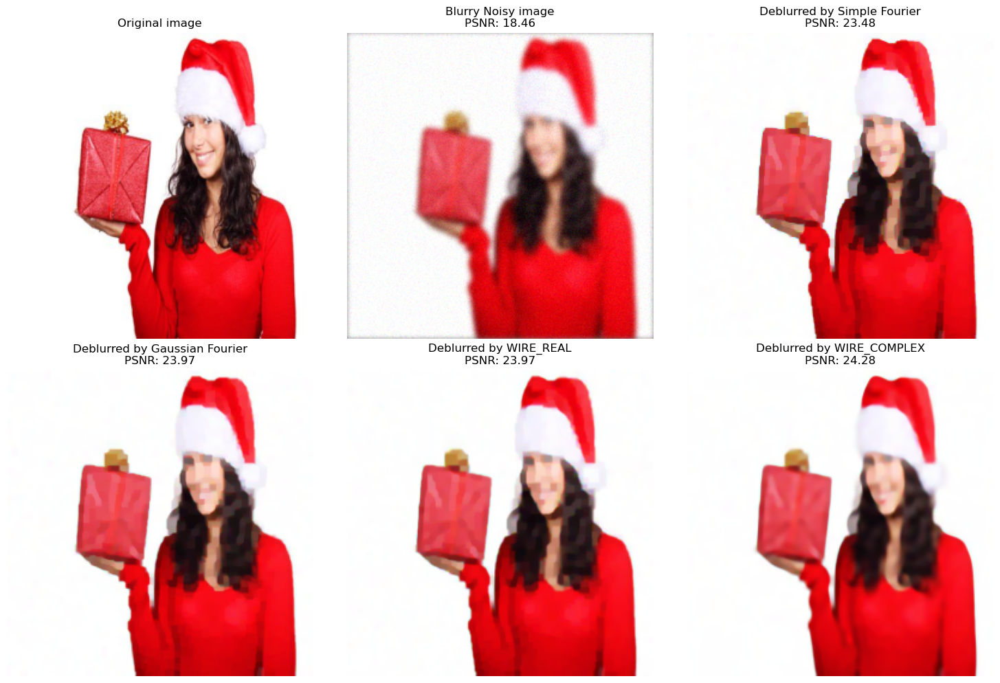

 55%|█████▌    | 11/20 [2:11:22<1:47:31, 716.88s/it]

Minimum loss for the simple_fourier method: 762.1298217773438
Minimum loss for the g_fourier method: 762.3931274414062
Minimum loss for the WIRE_real method: 766.9274291992188


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Minimum loss for the WIRE_complex method: 792.8050537109375


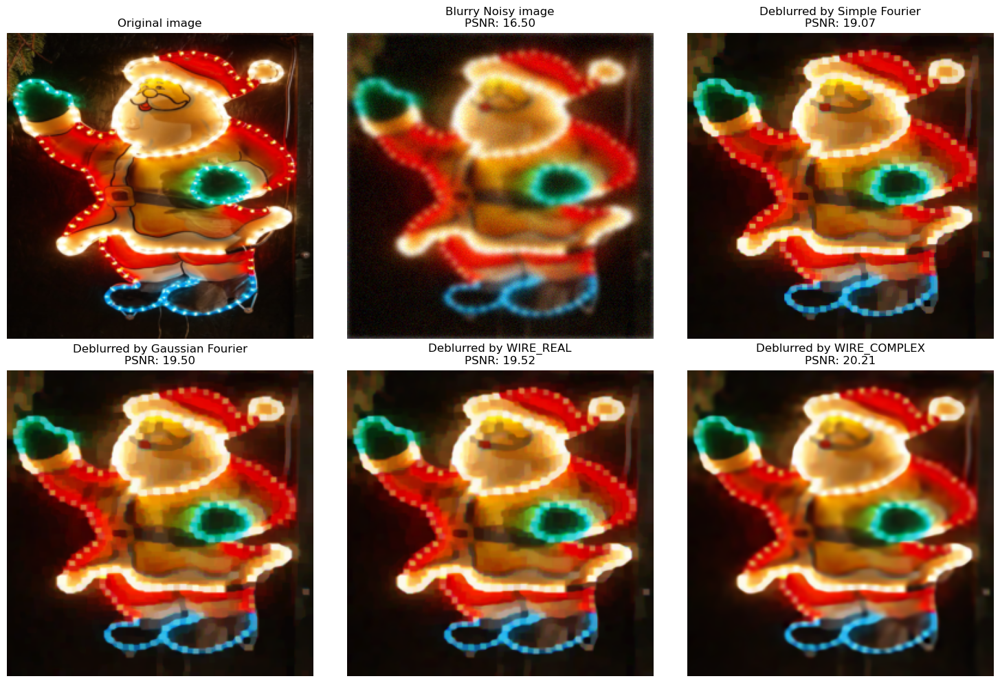

 60%|██████    | 12/20 [2:23:19<1:35:35, 716.92s/it]

Minimum loss for the simple_fourier method: 808.4983520507812
Minimum loss for the g_fourier method: 809.8909301757812


In [114]:
pipeline = Pipeline(dataloader, alpha = 0.02, lr = 4e-3, num_samples=5000)
pipeline.run()

In [3]:
# Zoomed versions
    zoom_size = 64
    axs[1, 2].imshow(images[:zoom_size, :zoom_size])
    axs[1, 2].set_title("Original (Zoomed)")
    axs[1, 2].axis('off')

    axs[2, 0].imshow(u_simple[:zoom_size, :zoom_size])
    axs[2, 0].set_title("Simple Fourier (Zoomed)")
    axs[2, 0].axis('off')

    axs[2, 1].imshow(u_fourier[:zoom_size, :zoom_size])
    axs[2, 1].set_title("Gaussian Fourier (Zoomed)")
    axs[2, 1].axis('off')

    axs[2, 2].imshow(u_wire[:zoom_size, :zoom_size])
    axs[2, 2].set_title("WIRE (Zoomed)")
    axs[2, 2].axis('off')


#### Testing for poster

In [1]:
import torch
import torch.nn as nn
import torch.nn.functional as F
import matplotlib.pyplot as plt
from torchvision import transforms
from PIL import Image
import numpy as np
from torch.utils.data import Dataset
import os
from torch.utils.data import DataLoader
from tqdm import tqdm


transform = transforms.Compose([
    transforms.Resize((256, 256)), 
    transforms.ToTensor(), 
    transforms.Normalize((0.5, 0.5, 0.5), (0.5, 0.5, 0.5)),
])


img_path = '/data/raml/group1/Arbeit-chinna/RAML/66.png'
image = Image.open(img_path)

y = transform(image).unsqueeze(0)  # batch




def PSNR(x, gt):
    return 10 * torch.log10(torch.max(x) / torch.mean((x - gt) ** 2))


class GaussianFourierFeature(nn.Module):
    def __init__(self, in_features, mapping_size, scale):
        super(GaussianFourierFeature, self).__init__()
        
        self.B = nn.Parameter(scale * torch.randn(mapping_size, in_features), requires_grad=False)
   
    def forward(self, x):
        x_proj = 2 * np.pi * x @ self.B.t()
        return torch.concat([torch.sin(x_proj), torch.cos(x_proj)], dim=-1)

class FourierFeatureNetwork(nn.Module):
    def __init__(self, in_features, hidden_features, out_features, mapping_size, scale):
        super(FourierFeatureNetwork, self).__init__()
        self.f_tr = GaussianFourierFeature(in_features, mapping_size, scale)
        self.fc1 = nn.Linear(2 * mapping_size, hidden_features)
        self.fc2 = nn.Linear(hidden_features, hidden_features)
        self.fc3 = nn.Linear(hidden_features, out_features)
        self.relu = nn.ReLU()
    
    def forward(self, x):
        x = self.f_tr(x)
        x = self.relu(self.fc1(x))
        x = self.relu(self.fc2(x))
        x = self.fc3(x)
        return x
    
    
# 3rd Complex Gerbor with WIRE   
class ComplexGaborLayer2D(nn.Module):
    def __init__(self, in_features, out_features, bias=True,
                 is_first=False, omega0=10.0, sigma0=10.0,
                 trainable=False):
        super().__init__()
        self.omega_0 = omega0
        self.scale_0 = sigma0
        self.is_first = is_first
        
        self.in_features = in_features
        
        if self.is_first:
            dtype = torch.float
        else:
            dtype = torch.cfloat
            
        self.omega_0 = nn.Parameter(self.omega_0*torch.ones(1), trainable)
        self.scale_0 = nn.Parameter(self.scale_0*torch.ones(1), trainable)
        
        self.linear = nn.Linear(in_features, out_features, bias=bias, dtype=dtype)
        self.scale_orth = nn.Linear(in_features, out_features, bias=bias, dtype=dtype)
    
    def forward(self, input):
        lin = self.linear(input)
        scale_x = lin
        scale_y = self.scale_orth(input)
        freq_term = torch.exp(1j*self.omega_0*lin)
        arg = scale_x.abs().square() + scale_y.abs().square()
        gauss_term = torch.exp(-self.scale_0*self.scale_0*arg)
        return freq_term*gauss_term


class WIRE_cmplx(nn.Module):
    def __init__(self, in_features, hidden_features, hidden_layers, out_features, 
                 first_omega_0=10, hidden_omega_0=10., scale=10.0):
        super().__init__()
        
        self.nonlin = ComplexGaborLayer2D
        hidden_features = int(hidden_features/2)  # Reduce hidden features for complex numbers
        
        self.net = []
        self.net.append(self.nonlin(in_features, hidden_features, 
                                    omega0=first_omega_0, sigma0=scale, 
                                    is_first=True, trainable=False))

        for _ in range(hidden_layers):
            self.net.append(self.nonlin(hidden_features, hidden_features, 
                                        omega0=hidden_omega_0, sigma0=scale))

        final_linear = nn.Linear(hidden_features, out_features, dtype=torch.cfloat)
        self.net.append(final_linear)
        
        self.net = nn.Sequential(*self.net)
    
    def forward(self, coords):
        output = self.net(coords)
        return output.real
    
# Training loop
class Deblurring_training():
    def __init__(self, y, net = None,  method_used = str , num_samples=2000, alpha=0.02, lr=0.01 ,**kwargs):
        self.y = y
        self.net = net
        self.method_used = method_used
        self.num_samples = num_samples
        self.alpha = alpha
        self.lr = lr
        self.kwargs = kwargs
        self.device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
        
        self.height, self.width = y.shape[2], y.shape[3]
        #self.x_torch = torch.stack(torch.meshgrid(torch.linspace(0, 1, self.height), torch.linspace(0, 1, self.width)), dim=-1).view(-1, 2).to(self.device)
        H, W = self.height, self.width
        a = torch.linspace(-1, 1, W).to(self.device)
        b = torch.linspace(-1, 1, H).to(self.device)

        X, Y = torch.meshgrid(a, b, indexing='xy')
        self.x_torch = torch.hstack((X.reshape(-1, 1), Y.reshape(-1, 1)))
        
        self.y = self.y.to(self.device)
        if net == None:
            self.model = None
        else:
            self.model = self.net(**self.kwargs).to(self.device)
        
        self.Gaussian_kernel = self.create_gaussian_kernel().to(self.device)
        self.y_blurry_noisy = self.create_blurry_noisy_image()
        
        self.u_1 = self.y_blurry_noisy.clone().to(self.device) 
        
        if self.method_used == "Explicit":
            self.optimizer = torch.optim.Adam([self.u_1], lr=self.lr)
        else:       
            self.optimizer = torch.optim.Adam(params=self.model.parameters(), lr=self.lr)
            
        self.scheduler = torch.optim.lr_scheduler.LambdaLR(self.optimizer, lambda x: 0.1**min(x/self.num_samples, 1))
        
        
        self.diff_kernel_x = torch.tensor([[-1, 1]], dtype=torch.float).view(1, 1, 1, 2).repeat(3, 1, 1, 1).to(self.device)
        self.diff_kernel_y = torch.tensor([[-1], [1]], dtype=torch.float).view(1, 1, 2, 1).repeat(3, 1, 1, 1).to(self.device)
        
        
    # Gaussian Blur 
    def create_gaussian_kernel(self, kernel_size=21, sigma=2, channels=3):
        a = torch.arange(-kernel_size // 2 + 1., kernel_size // 2 + 1.)
        xx, yy = torch.meshgrid(a, a, indexing='ij')
        kernel = torch.exp(-0.5 * (xx**2 + yy**2) / sigma**2)
        kernel = kernel / torch.sum(kernel)
        
        gaussian_kernel = kernel.expand(channels, 1, kernel_size, kernel_size)
        
        return gaussian_kernel
    
    def create_blurry_noisy_image(self):
        y_blurry = F.conv2d(self.y, self.Gaussian_kernel, groups=3, padding=10)
        y_blurry_noisy = y_blurry + torch.randn_like(y_blurry) * 0.05
        
        return y_blurry_noisy.to(self.device)

    
    def train(self):
        
        Loss = []
        for i in tqdm(range(self.num_samples)):
            self.optimizer.zero_grad()
            
            if self.method_used == "Explicit":
                u = self.u_1
                u.requires_grad = True
            else:
                u = self.model(self.x_torch).view(1, self.height, self.width, 3).permute(0, 3, 1, 2)
            
            convresult = F.conv2d(u, self.Gaussian_kernel, padding=10, groups=3)
            data_term = torch.sum((convresult - self.y_blurry_noisy) ** 2)
            
            regularization_term_x = torch.sum(torch.abs(F.conv2d(u, self.diff_kernel_x, padding=0, groups=3)))
            regularization_term_y = torch.sum(torch.abs(F.conv2d(u, self.diff_kernel_y, padding=0, groups=3)))
            regularization_term = regularization_term_x + regularization_term_y

            loss = data_term + self.alpha * regularization_term
            
            loss.backward()
            self.optimizer.step()
            self.scheduler.step()
            # if i % 100 == 0:
            #     print(f"Epoch {i}, Loss: {loss.item()}")
            
            Loss.append(loss.item())
        # self.model.eval()    
        print(f'Minimum loss for the {self.method_used} method: {min(Loss)}')
                
        return u.detach() 
 
class Pipeline():
    def __init__(self, images, alpha = 0.0001, lr = 1e-3, num_samples=2000):
        self.images = images
        self.alpha = alpha
        self.lr = lr
        self.num_samples = num_samples
        self.device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
                
    def run(self):             
    
        
        images = self.images.to(self.device)
        
        deblur_explicit = Deblurring_training(images, None, method_used="Explicit", 
                                                num_samples=self.num_samples, alpha=self.alpha, lr=self.lr,)
        u_explicit = deblur_explicit.train()
        psnr_explicit = PSNR(u_explicit, images).item()
        
        
        deblur_fourier = Deblurring_training(images, FourierFeatureNetwork, method_used="Gaussian_Fourier", 
                                                num_samples=self.num_samples, alpha=self.alpha, lr=self.lr, 
                                                in_features=2, hidden_features=512, out_features=3, 
                                                mapping_size=512, scale=10.0)
        u_fourier = deblur_fourier.train()
        psnr_fourier = PSNR(u_fourier, images).item()
                
        deblur_wire_c = Deblurring_training(images, WIRE_cmplx, method_used="WIRE_complex", 
                                            num_samples=self.num_samples, alpha=self.alpha, lr=self.lr,
                                            in_features=2, hidden_features=300, hidden_layers=2, out_features=3, 
                                            first_omega_0=10.0, hidden_omega_0=10.0, scale=10.0,)
        u_wire_cmplx = deblur_wire_c.train()
        psnr_wire_cmplx = PSNR(u_wire_cmplx, images).item()          
        
        
    
        self.Gaussian_kernel = self.create_gaussian_kernel().to(self.device)
        y_blurry_noisy = self.create_blurry_noisy_image(images)
        y_blurry_noisy_display = y_blurry_noisy.squeeze(0).permute(1, 2, 0)
        y_blurry_noisy_display = y_blurry_noisy_display * 0.5 + 0.5
        
        psnr_blur = PSNR(y_blurry_noisy, images).item()            
        # # Visualize results
        self.visualize_results(images, y_blurry_noisy, u_explicit, u_fourier, u_wire_cmplx, 
                                psnr_blur, psnr_explicit, psnr_fourier, psnr_wire_cmplx)
    
        
    def visualize_results(self, images, blurred, u_explicit, u_fourier, u_wire_cmplx, 
                          psnr_blur, psnr_explicit, psnr_fourier, psnr_wire_cmplx):
        
        
        fig1, axs1 = plt.subplots(1, 2, figsize=(10, 6))
        fig2, axs2 = plt.subplots(1, 3, figsize=(15, 6))

        # Original and blurred images
        images = images.squeeze().permute(1, 2, 0).cpu().numpy()
        images = images * 0.5 + 0.5
        axs1[0].imshow(images)
        axs1[0].set_title("Original image")
        axs1[0].axis('off')

        blurred = blurred.squeeze().permute(1, 2, 0).cpu().numpy()
        blurred = blurred * 0.5 + 0.5
        axs1[1].imshow(blurred)
        axs1[1].set_title(f"Blurry Noisy image\nPSNR: {psnr_blur:.2f}")
        axs1[1].axis('off')
        
        u_explicit = u_explicit.squeeze().permute(1, 2, 0).cpu().numpy()      
        u_explicit = u_explicit * 0.5 + 0.5  
        axs2[0].imshow(u_explicit)
        axs2[0].set_title(f"Deblurred by Explicit\nPSNR: {psnr_explicit:.2f}")
        axs2[0].axis('off')

        # Deblurred images
        u_fourier = u_fourier.squeeze().permute(1, 2, 0).cpu().numpy()
        u_fourier = u_fourier * 0.5 + 0.5
        axs2[1].imshow(u_fourier)
        axs2[1].set_title(f"Deblurred by Gaussian Fourier\nPSNR: {psnr_fourier:.2f}")
        axs2[1].axis('off')

        u_wire_cmplx = u_wire_cmplx.squeeze().permute(1, 2, 0).cpu().numpy()
        u_wire_cmplx = u_wire_cmplx * 0.5 + 0.5
        axs2[2].imshow(u_wire_cmplx)
        axs2[2].set_title(f"Deblurred by WIRE\nPSNR: {psnr_wire_cmplx:.2f}")
        axs2[2].axis('off')

        # Adjust layout and save figures
        fig1.tight_layout()
        fig2.tight_layout()
        # plt.subplots_adjust(top=0.9)

        # Create a directory to save the images if it doesn't exist
        save_dir = 'deblurred_results'
        os.makedirs(save_dir, exist_ok=True)

        # Save the figures
        fig1.savefig(os.path.join(save_dir, 'original_and_blurred.png'))
        fig2.savefig(os.path.join(save_dir, 'deblurred_results.png'))
        
        # Display the figures
        plt.show()
        
        # Close the figures to free up memory
        plt.close(fig1)
        plt.close(fig2)

        print(f"Images saved in the '{save_dir}' directory.")


              
                
    # Gaussian Blur 
    def create_gaussian_kernel(self, kernel_size=21, sigma=2, channels=3):
        a = torch.arange(-kernel_size // 2 + 1., kernel_size // 2 + 1.)
        xx, yy = torch.meshgrid(a, a, indexing='ij')
        kernel = torch.exp(-0.5 * (xx**2 + yy**2) / sigma**2)
        kernel = kernel / torch.sum(kernel)
        
        gaussian_kernel = kernel.expand(channels, 1, kernel_size, kernel_size)
        
        return gaussian_kernel
    
    def create_blurry_noisy_image(self, input):
        y_blurry = F.conv2d(input, self.Gaussian_kernel, groups=3, padding=10)
        y_blurry_noisy = y_blurry + torch.randn_like(y_blurry) * 0.05
        
        return y_blurry_noisy.to(self.device)
        

/data/raml/cda/anaconda3/envs/arb3/lib/python3.8/site-packages/tqdm/auto.py:21: TqdmWarning: IProgress not found. Please update jupyter and ipywidgets. See https://ipywidgets.readthedocs.io/en/stable/user_install.html
  from .autonotebook import tqdm as notebook_tqdm


100%|██████████| 5000/5000 [00:05<00:00, 934.52it/s] 


Minimum loss for the Explicit method: 496.3879699707031


100%|██████████| 5000/5000 [02:17<00:00, 36.41it/s]


Minimum loss for the Gaussian_Fourier method: 501.1315002441406


100%|██████████| 5000/5000 [03:37<00:00, 23.02it/s]
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Minimum loss for the WIRE_complex method: 509.4629211425781


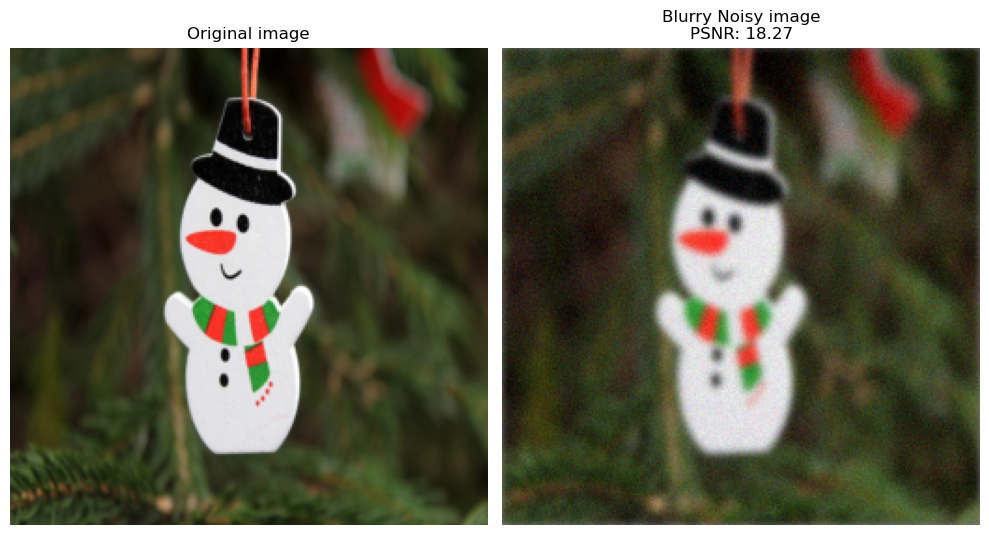

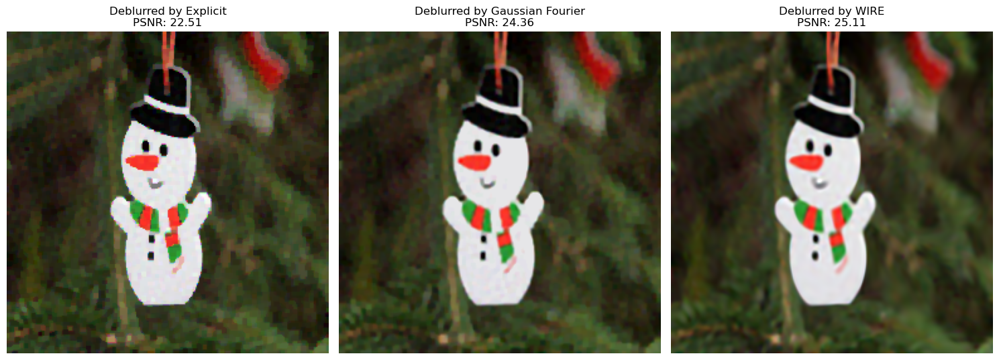

Images saved in the 'deblurred_results' directory.


In [3]:
pipeline = Pipeline(y, alpha = 0.004, lr = 5e-3, num_samples=5000)
pipeline.run()